<a href="https://colab.research.google.com/github/rhysdg/sam-at-a-clip/blob/feat-example-notebook/notebooks/siglip_onnx.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Basic Installation

In [3]:
!git clone https://github.com/rhysdg/sam-at-a-clip.git

Cloning into 'sam-at-a-clip'...
remote: Enumerating objects: 177, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (125/125), done.
remote: Total 177 (delta 81), reused 120 (delta 40), pack-reused 0
Receiving objects: 100% (177/177), 4.19 MiB | 25.88 MiB/s, done.
Resolving deltas: 100% (81/81), done.


In [ ]:
%cd sam-at-a-clip
!pip install -r requirements.txt

In [1]:
!ls

sam-at-a-clip  sample_data


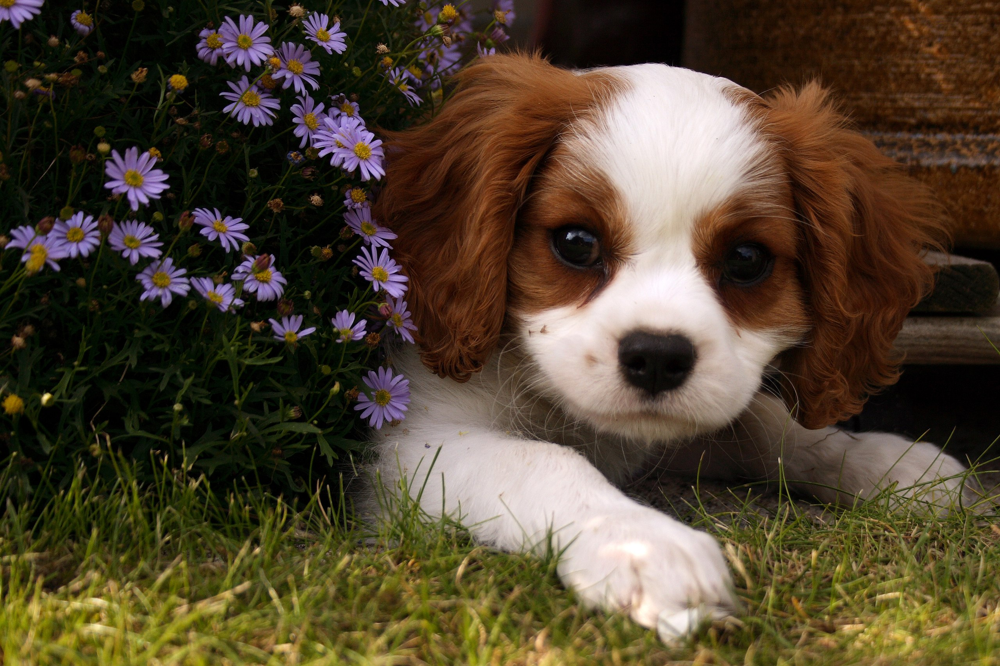

In [2]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/sam-at-a-clip/clip/data/dog.jpg')
cv2_imshow(img)

#Inference

Note that work is underway to remmove the dependency on the Hugginface AutoTokenizer here. This is a SigLIP only scenario currently and doesn't apply to CLIP

In [3]:
%cd /content/sam-at-a-clip/

from clip.model import OnnxClip, softmax, get_similarity_scores
from PIL import Image

images = [Image.open("clip/data/dog.jpg").convert("RGB")]

texts = {"classification": ["a photo of a man", "a photo of a woman", "s photo of a dog"],
         "situational": ["a dog standing up", "a dog running", "a dog laying on grass"],
     }


onnx_model = OnnxClip(batch_size=16, type='siglip')

image_embeddings = onnx_model.get_image_embeddings(images)
text_embeddings_class = onnx_model.get_text_embeddings(texts['classification'])
text_embeddings_situational = onnx_model.get_text_embeddings(texts['situational'])


contexts = {"classification": text_embeddings_class,
            "situational": text_embeddings_situational,
           }

logits = get_similarity_scores(image_embeddings, contexts)
probabilities = softmax(logits['classification'])


for k,v in contexts.items():

    print(f'\ncontext: {k}\n')
    probabilities = softmax(logits[k])

    for text, p in zip(texts[k], probabilities[0]):
        probabilities = softmax(logits['classification'], dim=1)
        print(f"Probability that the image is '{text}': {p:.3f}")

/content/sam-at-a-clip


Downloading...
From (original): https://drive.google.com/uc?id=1vZvBZIDPzax2AfoYwRWO7neo2SxoScEX
From (redirected): https://drive.google.com/uc?id=1vZvBZIDPzax2AfoYwRWO7neo2SxoScEX&confirm=t&uuid=3fff48a2-ab58-46ec-ab01-a4e31efd253b
To: /content/sam-at-a-clip/clip/data/siglip_image_384_fp16.onnx
100%|██████████| 187M/187M [00:01<00:00, 93.8MB/s]


*************** EP Error ***************
EP Error /onnxruntime_src/onnxruntime/python/onnxruntime_pybind_state.cc:456 void onnxruntime::python::RegisterTensorRTPluginsAsCustomOps(onnxruntime::python::PySessionOptions&, const ProviderOptions&) Please install TensorRT libraries as mentioned in the GPU requirements page, make sure they're in the PATH or LD_LIBRARY_PATH, and that your GPU is supported.
 when using ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']
Falling back to ['CUDAExecutionProvider', 'CPUExecutionProvider'] and retrying.
****************************************


Downloading...
From (original): https://drive.google.com/uc?id=1oUl6H3Y0Az8F1GGXVmEPPcy52dasWeiD
From (redirected): https://drive.google.com/uc?id=1oUl6H3Y0Az8F1GGXVmEPPcy52dasWeiD&confirm=t&uuid=14f450ca-86ac-4cb1-a797-b5de1dafbefe
To: /content/sam-at-a-clip/clip/data/siglip_text_384_fp16.onnx
100%|██████████| 221M/221M [00:01<00:00, 112MB/s]


*************** EP Error ***************
EP Error /onnxruntime_src/onnxruntime/python/onnxruntime_pybind_state.cc:456 void onnxruntime::python::RegisterTensorRTPluginsAsCustomOps(onnxruntime::python::PySessionOptions&, const ProviderOptions&) Please install TensorRT libraries as mentioned in the GPU requirements page, make sure they're in the PATH or LD_LIBRARY_PATH, and that your GPU is supported.
 when using ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']
Falling back to ['CUDAExecutionProvider', 'CPUExecutionProvider'] and retrying.
****************************************


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]


context: classification

Probability that the image is 'a photo of a man': 0.212
Probability that the image is 'a photo of a woman': 0.212
Probability that the image is 's photo of a dog': 0.576

context: situational

Probability that the image is 'a dog standing up': 0.219
Probability that the image is 'a dog running': 0.226
Probability that the image is 'a dog laying on grass': 0.555
